# <div align="center"><b> Hyperspatial remote sensing and polarimetric SAR for urban and environmental applications </b></div>

<div align="right">

<!-- [![Binder](http://mybinder.org/badge.svg)](https://mybinder.org/) -->
[![nbviewer](https://img.shields.io/badge/render-nbviewer-orange?logo=Jupyter)](https://nbviewer.org/)
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://githubtocolab.com/)

</div>

* * *

<style>
/* Limitar la altura de las celdas de salida en html */
.jp-OutputArea.jp-Cell-outputArea {
    max-height: 500px;
}
</style>

<!-- Colab -->
<!-- <div align="center"><img src="https://drive.google.com/uc?export=view&id=16OicryDZ8P4iTg06AwXts4wNe7efEH8S" width="600" alt="Figure 1. Prompt: Generate an image of the city of Milan with a hyperspectral and polarimetric SAR appearance – generated with Microsoft Image Creator."></div> -->

<div align="center"><img src="./resources/images/cover-image.jpeg" width="600" alt="Figura 1: A data scientist playing with convolutional neural networks. - Generada con Microsoft Image Creator"></div>

<div align="center"><small><em>Prompt: Generate an image of the city of Milan with a hyperspectral and polarimetric SAR appearance - Generated with Microsoft Image Creator.</em></small></div>

<div align="center">✨<strong>Project Summary:</strong>✨</div>

<p></p>

<div align="center">

| Subtitle       | Final assigment                                                                                                                |
| --------------- | -------------------------------------------------------------------------------------------------------------------------------------- |
| **Description**  | Hyperspectral and polarimetric SAR remote sensing for urban and environmental applications. <br/>Extraction of structural and environmental information in Milan using dual-pol SAR and hyperspectral data.                                                                                                          |
| **Team members** | Bruno Masoller (brunomaso1@hotmail.com)                                                                                                  |

</div>

🛻 <em><font color='MediumSeaGreen'>  Instalations: </font></em> 🛻

In [1]:
# %uv sync
# %pip install . 

✋ <em><font color='DodgerBlue'>Imports:</font></em> ✋

In [2]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from PIL import Image
import spectral
from scipy.signal import convolve2d
import numpy as np
import zipfile
from pathlib import Path
import math
import rasterio
import gdown as gd
import cv2

# Local file
from SPICE import *

🔧 <em><font color='tomato'>Configurations:</font></em> 🔧

In [3]:
# Notebook settings
TRAIN = False

# Folders
RESOURCES_FOLDER = Path("resources")
PRODUCTS_FOLDER = RESOURCES_FOLDER / "products"
RESULTS_FOLDER = RESOURCES_FOLDER / "results"
EXTRACT_FOLDER = RESOURCES_FOLDER / "S1_unzipped"

# Sub-folders
POLSAR_RESULTS_FOLDER = RESULTS_FOLDER / "pol_sar"
POLSAR_RESULTS_FIGURES_FOLDER = POLSAR_RESULTS_FOLDER / "figures"
POLSAR_RESULTS_IMAGES_FOLDER = POLSAR_RESULTS_FOLDER / "images"
HYPERSPECTRAL_RESULTS_FOLDER = RESULTS_FOLDER / "hyperspectral"
HYPERSPECTRAL_RESULTS_FIGURES_FOLDER = HYPERSPECTRAL_RESULTS_FOLDER / "figures"
HYPERSPECTRAL_RESULTS_IMAGES_FOLDER = HYPERSPECTRAL_RESULTS_FOLDER / "images"

# Create necessary directories
POLSAR_RESULTS_FOLDER.mkdir(parents=True, exist_ok=True)
POLSAR_RESULTS_IMAGES_FOLDER.mkdir(parents=True, exist_ok=True)
POLSAR_RESULTS_FIGURES_FOLDER.mkdir(parents=True, exist_ok=True)
HYPERSPECTRAL_RESULTS_FOLDER.mkdir(parents=True, exist_ok=True)
HYPERSPECTRAL_RESULTS_FIGURES_FOLDER.mkdir(parents=True, exist_ok=True)
HYPERSPECTRAL_RESULTS_IMAGES_FOLDER.mkdir(parents=True, exist_ok=True)

# Names
ZIP_FILE_NAME = "subset_0_of_S1A_IW_SLC__1SDV_20230104T171513_20230104T171540_046637_0596FA_90EB_split_Orb_Cal_deb_mat_ML_Spk_slope.data.zip"
PRISMA_MILANO_RGB_NAME = "PRISMA_Milano_city_RGB.png"

# Paths
ZIP_PATH = PRODUCTS_FOLDER / ZIP_FILE_NAME
PRISMA_MILANO_RGB_PATH = HYPERSPECTRAL_RESULTS_FIGURES_FOLDER / PRISMA_MILANO_RGB_NAME

# Parameters
KERNEL_SIZE = 5
KERNEL = np.ones((KERNEL_SIZE, KERNEL_SIZE), np.float32) / (KERNEL_SIZE * KERNEL_SIZE)
PADDING = int((KERNEL_SIZE - 1) / 2)
METHOD = "dcmp"
P_TYPE = "SLC"
ENDMEMBERS_Q = 4

# Display settings
DISPLAY_CONFIG = {
    "DpRBI_slc": {"title": "Dual-pol Radar Built-up Index (DpRBI)", "cmap": "inferno"},
    "DpRSI_slc": {"title": "Dual-pol Radar Surface Index (DpRSI)", "cmap": "Blues"},
    "Alpha_dp_slc": {"title": "Dual-pol Scattering Angle (Alpha_dp)", "cmap": "cividis"},
    "Pdl_dcmp_slc": {"title": "Dihedral-like Component (Pdl_dcmp)", "cmap": "magma"},
    "Psl_dcmp_slc": {"title": "Surface-like Component (Psl_dcmp)", "cmap": "viridis"},
    "DpRBI_binary_slc": {"title": "DpRBI Binary Mask (≥1/√3)", "cmap": ListedColormap(["white", "red"])},
}


# Download data from Google Drive
DRIVE_ID = "1cgV-01SvMjmst-tRzQIL9TjStYvwdv5H"
# gd.download_folder(id=DRIVE_ID, quiet=True)

## Assigment

### Topic
**Extraction of structural and environmental information in Milan using dual-pol SAR and hyperspectral data**

---

#### EO Datasets
- **Sentinel-1 IW SLC (VV/VH)** image over Milan  
- **PRISMA hyperspectral imagery (HSI)** over the same AOI  
- **Copernicus Urban Atlas** [link](https://land.copernicus.eu/en/technical-library/urban_atlas_2012_2018_mapping_guide/@@download/file) as land use/land cover (LULC) reference  

---

#### Tasks
1. Derive **dual-pol descriptors** to characterize the structural and environmental properties of the urban landscape.  
2. Extract **spectral indicators** and **fractional information** describing the distribution of urban and natural surface materials.  
3. **Harmonize SAR- and HSI-derived products** to a common spatial grid and compare them against the different LULC classes.  
4. Investigate the **relationships between SAR and hyperspectral indicators** across urban categories, highlighting how their integration enhances the characterization of urban form and environmental composition.


## Solution

Milano AOI:

```
POLYGON((9.055534161 45.37500252, 9.329315414 45.37500252, 9.329315414 45.568107136, 9.055534161 45.568107136, 9.055534161 45.37500252))
```

### 1. Derive **dual-pol descriptors** to characterize the structural and environmental properties of the urban landscape.  

#### 1.1. Preprocesamiento con SNAP

La primera parte de esta tarea se basa en obtener los descriptores para caracterizar componentes urbanas, superficies o vegetación, específicamente el objetivo es obtener varios índices que están nombrados en el paper: "[Scattering power components from dual-pol Sentinel-1 SLC and GRD SAR data](https://www.sciencedirect.com/science/article/abs/pii/S0924271624002089)".

El objetivo es obtener los descriptores $g_1, g_2, g_3$ (normalizados), para luego computar los índices $DpRBI$ (construciones del tipo "dihedral-like") y $DpRSI$ ("surface-like") y finalmente obtener el coeficiente $\alpha$ y las potecias de dispersión.

En clase hicimos este procesamiento que consistió en varios pasos detallados en la siguiente tabla:

<div align="center">

| Step | Objective           | Description                      |
|------|---------------------|----------------------------------|
| 1    | Preprocessing       | Load data                        |
| 2    | Preprocessing       | Select polarizations             |
| 3    | Preprocessing       | Apply orbit file                 |
| 4    | Preprocessing       | Radiometric calibration          |
| 5    | Preprocessing       | Deburst                          |
| 6    | Covariance matrix   | Matrix generation                |
| 7    | Covariance matrix   | Multilooking                     |
| 8    | Covariance matrix   | Polarimetric speckle filtering   |
| 9    | Slope               | Compute gradient                 |
| 10   | AOI                 | Specify area of interest         |

</div>

El resultado del procesamiento se puede ver en la siguiente imagen:

<div align="center"><img src="./resources/images/snap-final-product.png" width="600" alt="Figure 2. Screenshoot of SNAP"></div>

<div align="center"><small><em>Figure 2. Screenshoot of SNAP.</em></small></div>



#### 1.2. Cálculo de descriptores

Abrir producto de SNAP:

- Cargar producto:

In [4]:
if not ZIP_PATH.exists():
    raise FileNotFoundError(f"❌ El archivo ZIP no se encontró en la ruta: {ZIP_PATH.resolve()}")

if not EXTRACT_FOLDER.exists():
    EXTRACT_FOLDER.mkdir(parents=True, exist_ok=True)
    with zipfile.ZipFile(ZIP_PATH, "r") as zip_ref:
        zip_ref.extractall(EXTRACT_FOLDER)

    print(f"✅ Archivos extraídos a: {EXTRACT_FOLDER.resolve()}")
else:
    print(f"📁 La carpeta ya existe: {EXTRACT_FOLDER.resolve()}")

data_folder = next((d for d in EXTRACT_FOLDER.rglob("*.data") if d.is_dir()), None)

if data_folder is None:
    raise FileNotFoundError(
        f"❌ No se encontró ninguna carpeta terminada en '.data' dentro de: {EXTRACT_FOLDER.resolve()}"
    )
print(f"🎯 Carpeta de datos encontrada: {data_folder.resolve()}")

📁 La carpeta ya existe: E:\Documentos\Git Repositories\fing-cpap\final-project\resources\S1_unzipped
🎯 Carpeta de datos encontrada: E:\Documentos\Git Repositories\fing-cpap\final-project\resources\S1_unzipped\subset_0_of_S1A_IW_SLC__1SDV_20230104T171513_20230104T171540_046637_0596FA_90EB_split_Orb_Cal_deb_mat_ML_Spk_slope.data


- Mostrar metadatos:

In [5]:
# === Buscar recursivamente todos los archivos .hdr (ignorando los '._' de macOS) ===
hdr_files = [p for p in EXTRACT_FOLDER.rglob("*.hdr") if not p.name.startswith("._")]

# === Mostrar los primeros 15 renglones de metadatos de cada .hdr ===
for hdr in sorted(hdr_files):
    print(f"\n=== {hdr.name} ===")
    with hdr.open("r", encoding="utf-8", errors="ignore") as f:
        for i, line in enumerate(f):
            if i >= 15:
                break
            print(line.strip())


=== aspect.hdr ===
ENVI
description = {Sentinel-1 IW Level-1 SLC Product - Unit: deg}
samples = 1609
lines = 1787
bands = 1
header offset = 0
file type = ENVI Standard
data type = 4
interleave = bsq
byte order = 1
band names = { aspect }
data gain values = {1.0}
data offset values = {0.0}

=== C11.hdr ===
ENVI
description = {Sentinel-1 IW Level-1 SLC Product - Unit: intensity}
samples = 1609
lines = 1787
bands = 1
header offset = 0
file type = ENVI Standard
data type = 4
interleave = bsq
byte order = 1
band names = { C11 }
data gain values = {1.0}
data offset values = {0.0}

=== C12_imag.hdr ===
ENVI
description = {Sentinel-1 IW Level-1 SLC Product - Unit: imaginary}
samples = 1609
lines = 1787
bands = 1
header offset = 0
file type = ENVI Standard
data type = 4
interleave = bsq
byte order = 1
band names = { C12_imag }
data gain values = {1.0}
data offset values = {0.0}

=== C12_real.hdr ===
ENVI
description = {Sentinel-1 IW Level-1 SLC Product - Unit: real}
samples = 1609
lines = 1787

- Mostrar los datos:

e:\Documentos\Git Repositories\fing-cpap\final-project\.venv\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


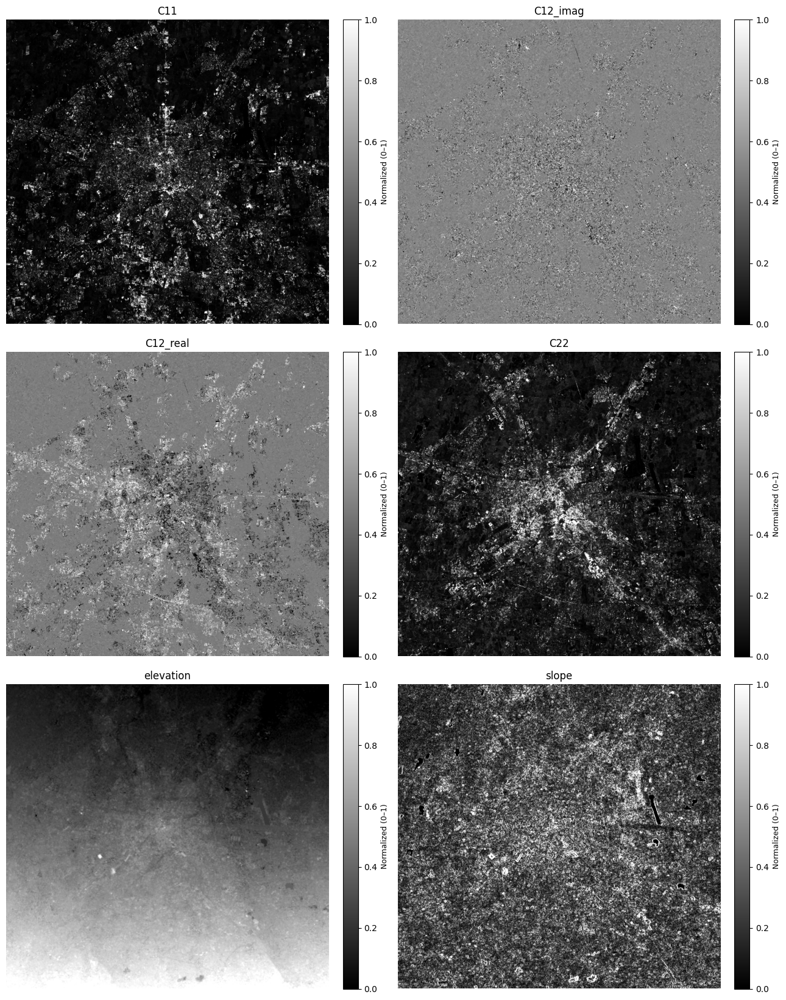

In [6]:
# === Buscar .hdr en la carpeta de datos (ignorando 'aspect' y prefijos '._') ===
hdr_files = sorted(
    [p for p in data_folder.glob("*.hdr") if "aspect" not in p.name.lower() and not p.name.startswith("._")]
)

# === Prepare subplot grid ===
n = len(hdr_files)
cols = 2 if n > 1 else 1
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(6.5 * cols, 5.5 * rows))
axes = np.array(axes).reshape(-1)
cmap = "gray"

for i, hdr in enumerate(hdr_files):
    band_name = hdr.stem
    img_path = hdr.with_suffix(".img")

    if not img_path.exists():
        print(f"No .img found for {band_name}")
        continue

    with rasterio.open(img_path) as src:
        band = src.read(1).astype(float)
        desc = src.descriptions[0] if src.descriptions and src.descriptions[0] else band_name

        # Percentile clipping (2–98%)
        p2, p98 = np.percentile(band[np.isfinite(band)], (2, 98))
        band_clipped = np.clip(band, p2, p98)

        # Normalize 0–1
        band_norm = (band_clipped - p2) / (p98 - p2)
        band_norm = np.clip(band_norm, 0, 1)

        # Plot
        ax = axes[i]
        im = ax.imshow(band_norm, cmap=cmap, aspect='auto')
        ax.set_title(f"{desc}", fontsize=12)
        ax.axis("off")

        cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label("Normalized (0–1)", fontsize=9)

# Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

Calcular descriptores:

- Funciones auxiliares:

In [7]:
def display_polarimetric_descriptors(g0, g1, g2, g3):
    """
    Muestra los resultados de los descriptores.
    """
    print("\n" + "="*50)
    print("🚀 POLARIMETRIC DESCRIPTORS (PAULI PARAMETERS)")
    print("="*50)

    # Dictionary of descriptors for iteration
    descriptors = {
        'g0 (Total Power / Span)': g0,
        'g1 (Diagonal Difference)': g1,
        'g2 (Real Part of C12)': g2,
        'g3 (Imaginary Part of C12)': g3
    }

    for name, descriptor in descriptors.items():
        print(f"\n### 📊 {name}")
        print(f"  - **Dimensions (Shape):** {descriptor.shape}")
        print(f"  - **Data Type (Dtype):** {descriptor.dtype}")
        print(f"  - **Minimum Value (Min):** {np.min(descriptor):.4f}")
        print(f"  - **Maximum Value (Max):** {np.max(descriptor):.4f}")
        print(f"  - **Average Value (Mean):** {np.mean(descriptor):.4f}")

    print("\n" + "="*50)

- Código principal:

In [8]:
# -*- coding: utf-8 -*-
"""
Created on Tue Dec 14 10:44:17 2024

Description: This codes computes the scattering power componennts for
SLC (intensity and phase) dual-pol SAR data (decomposition based approach)

@author: Mr. Abhinav Verma and Prof. Avik Bhattacharya,
MRSLab, CSRE, IIT Bombay

Related publication: Abhinav Verma, Avik Bhattacharya, Subhadip Dey, Armando Marino, and Paolo Gamba 2024
"Target Characterization and Scattering Power Components From Dual-Pol Sentinel-1 SAR Data".
IEEE Transactions on Geoscience and Remote Sensing, vol. 62, pp. 1-19, 2024, Art no. 5222619.
DOI: 10.1109/TGRS.2024.3460476

List of inputs:
1. A processed C2 matrix
2. A slope file (tool avilable in SNAP software)
Note 1 and 2 should be present inside a same data_folder

"""
##### Reading the C2 matrix
C11_image = spectral.open_image(Path(data_folder) / "C11.hdr")
C11 = C11_image.load()
C11 = C11.reshape(C11.shape[0], -1)

C12_image_r = spectral.open_image(Path(data_folder) / "C12_real.hdr")
C12_r = C12_image_r.load()
C12_r = C12_r.reshape(C12_r.shape[0], -1)

C12_image_i = spectral.open_image(Path(data_folder) / "C12_imag.hdr")
C12_i = C12_image_i.load()
C12_i = C12_i.reshape(C12_i.shape[0], -1)

C22_image = spectral.open_image(Path(data_folder) / "C22.hdr")
C22 = C22_image.load()
C22 = C22.reshape(C22.shape[0], -1)

slope_image = spectral.open_image(Path(data_folder) / "slope.hdr")
slope = slope_image.load()
slope = slope.reshape(slope.shape[0], -1)

##### Averaging the values over a square kernel
C11_av = convolve2d(C11, KERNEL, mode="valid")
C11_av = np.pad(C11_av, pad_width=PADDING, mode="constant", constant_values=0)

C11_av_db = 10 * np.log10(C11_av)

C12_r_av = convolve2d(C12_r, KERNEL, mode="valid")
C12_r_av = np.pad(C12_r_av, pad_width=PADDING, mode="constant", constant_values=0)

C12_i_av = convolve2d(C12_i, KERNEL, mode="valid")
C12_i_av = np.pad(C12_i_av, pad_width=PADDING, mode="constant", constant_values=0)

# Element C21 is conjugate of C12
# C12_av = C12_r_av + 1j*C12_i_av;
# C21_av = np.conj(C12_av);

C22_av = convolve2d(C22, KERNEL, mode="valid")
C22_av = np.pad(C22_av, pad_width=PADDING, mode="constant", constant_values=0)

slope_av = convolve2d(slope, KERNEL, mode="valid")
slope_av = np.pad(slope_av, pad_width=PADDING, mode="constant", constant_values=0)

slope_msk = np.where(slope_av >= 12, 0, 1)

##### Calculating Stokes vector elements
s0 = C11_av + C22_av
s1 = C11_av - C22_av
s2 = 2 * C12_r_av
s3 = 2 * C12_i_av

##### Calculate Entropy
## Eigenvalue computation from Stokes vector elements
tpp = np.sqrt(
    np.square(s1) + np.square(s2) + np.square(s3)
)  # Total Polarized Power (magnitude of polarization vector); directly related to DoP by DoP = tpp / s0
lmbd1 = (s0 + tpp) / 2  # First eigenvalue (dominant scattering component)
lmbd2 = (s0 - tpp) / 2  # Second eigenvalue (secondary scattering component)
prob1 = lmbd1 / (lmbd1 + lmbd2)  # Probability of first eigen-component
prob2 = lmbd2 / (lmbd1 + lmbd2)  # Probability of second eigen-component
ent = -prob1 * np.log2(prob1) - prob2 * np.log2(prob2)  # Polarimetric entropy (scattering randomness)
dop = (lmbd1 - lmbd2) / (lmbd1 + lmbd2)  # Degree of Polarization (fraction of polarized power)
beta = lmbd1 / (lmbd1 + lmbd2)  # Beta parameter (dominance of first eigen-component)

##### Taking abs of Stokes vector elements
s0 = np.abs(s0)
s1 = np.abs(s1)
s2 = np.abs(s2)
s3 = np.abs(s3)

##### Slope mask the Stokes vector elements
s1_mask = np.multiply(s1, slope_msk)
s2_mask = np.multiply(s2, slope_msk)
s3_mask = np.multiply(s3, slope_msk)


##### Normalizing Stokes vector elements
def S_norm(S_array):
    S_5 = np.percentile(S_array, 5)
    S_95 = np.percentile(S_array, 95)
    S_cln = np.where(S_array > S_95, S_95, S_array)
    S_cln = np.where(S_cln < S_5, S_5, S_cln)
    S_cln_max = np.max(S_cln)
    S_norm_array = np.divide(S_cln, S_cln_max)

    return S_norm_array


s1_norm = S_norm(s1_mask)
s2_norm = S_norm(s2_mask)
s3_norm = S_norm(s3_mask)

s1_s_norm = S_norm(s1)  # This is S1 normalzied for DpRSI, does not include slope mask

##### Power Calculation

dprbi = np.sqrt(np.square(s1_norm) + np.square(s2_norm) + np.square(s3_norm)) / np.sqrt(3)

dprsi_con1 = (1 - ent) * np.sqrt(1 - np.square(s1_s_norm))
# For Valid pixels
dprsi_con2 = np.sqrt(1 - np.square(s1_s_norm))
# For Noise pixels

NESZ = -16  ## For Sentinel-1
dprsi = np.where(C11_av_db > NESZ, dprsi_con1, dprsi_con2)

shp = np.shape(dprbi)

alpha1 = np.arctan2(dprbi, 1 - dprbi)
alpha1 = np.degrees(alpha1)

alpha2 = np.arctan2(1 - dprsi, dprsi)
alpha2 = np.degrees(alpha2)

alpha_dp = (alpha1 + alpha2) / 2
# Dual-pol target characteristic parameter proposed in Verma et al. 2024

## Alpha as geomteric factor
alpha_dp_rad = np.radians(2 * alpha_dp)

cos_a = np.cos(alpha_dp_rad)

## Power components for valid pixels (VV > NESZ)
Pu_v = (1 - dop) * s0
Pd_v = (1 / 2) * dop * s0 * (1 - cos_a)
Ps_v = (1 / 2) * dop * s0 * (1 + cos_a)

## Power components for noise pixels (VV < NESZ)
Pu_n = (1 - beta) * s0
Pd_n = (1 / 2) * beta * s0 * (1 - cos_a)
Ps_n = (1 / 2) * beta * s0 * (1 + cos_a)

## Dual-pol scattering power
Pu = np.where(C11_av_db > NESZ, Pu_v, Pu_n)  # Unpolized power
Pd = np.where(C11_av_db > NESZ, Pd_v, Pd_n)  # "Dihedral-like" power
Ps = np.where(C11_av_db > NESZ, Ps_v, Ps_n)  # "Surface-like" power

## Saving the output
dprbi = dprbi.astype(np.float32)
dprsi = dprsi.astype(np.float32)
Pd = Pd.astype(np.float32)
Ps = Ps.astype(np.float32)
Pu = Pu.astype(np.float32)

metadata = C11_image.metadata

metadata.update({"band names": "DpRBI_slc"})
spectral.envi.save_image(
    Path(POLSAR_RESULTS_IMAGES_FOLDER / "DpRBI_slc.hdr"), dprbi, metadata=metadata, interleave="bsq", ext=".bin", force=True
)

# --- Dual-pol RBI binary SLC: DpRBI_slc >= 1/sqrt(3) ---
thr = 1.0 / np.sqrt(3.0)  # ≈ 0.577350269...
dprbi_bin = np.where(np.isfinite(dprbi) & (dprbi >= thr), 1, 0).astype(np.uint8)

# salva come ENVI (0/1) con coppia .hdr + .bin
metadata.update({"band names": "DpRBI_binary_slc"})
spectral.envi.save_image(
    Path(POLSAR_RESULTS_IMAGES_FOLDER / "DpRBI_binary_slc.hdr"),
    dprbi_bin,
    metadata=metadata,
    interleave="bsq",
    ext=".bin",
    force=True,
)

metadata.update({"band names": "DpRSI_slc"})
spectral.envi.save_image(
    Path(POLSAR_RESULTS_IMAGES_FOLDER / "DpRSI_slc.hdr"), dprsi, metadata=metadata, interleave="bsq", ext=".bin", force=True
)

metadata.update({"band names": "Alpha_dp_slc"})
spectral.envi.save_image(
    Path(POLSAR_RESULTS_IMAGES_FOLDER / "Alpha_dp_slc.hdr"), alpha_dp, metadata=metadata, interleave="bsq", ext=".bin", force=True
)

metadata.update({"band names": "Pdl_dcmp_slc"})
spectral.envi.save_image(
    Path(POLSAR_RESULTS_IMAGES_FOLDER / "Pdl_dcmp_slc.hdr"), Pd, metadata=metadata, interleave="bsq", ext=".bin", force=True
)

metadata.update({"band names": "Psl_dcmp_slc"})
spectral.envi.save_image(
    Path(POLSAR_RESULTS_IMAGES_FOLDER / "Psl_dcmp_slc.hdr"), Ps, metadata=metadata, interleave="bsq", ext=".bin", force=True
)

metadata.update({"band names": "Pu_dcmp_slc"})
spectral.envi.save_image(
    Path(POLSAR_RESULTS_IMAGES_FOLDER / "Pu_dcmp_slc.hdr"), Pu, metadata=metadata, interleave="bsq", ext=".bin", force=True
)

display_polarimetric_descriptors(s0, s0, s1, s3)

C:\Users\maso\AppData\Local\Temp\ipykernel_2868\140626810.py:47: RuntimeWarning: divide by zero encountered in log10
  C11_av_db = 10 * np.log10(C11_av)
C:\Users\maso\AppData\Local\Temp\ipykernel_2868\140626810.py:80: RuntimeWarning: invalid value encountered in divide
  prob1 = lmbd1 / (lmbd1 + lmbd2)  # Probability of first eigen-component
C:\Users\maso\AppData\Local\Temp\ipykernel_2868\140626810.py:81: RuntimeWarning: invalid value encountered in divide
  prob2 = lmbd2 / (lmbd1 + lmbd2)  # Probability of second eigen-component
C:\Users\maso\AppData\Local\Temp\ipykernel_2868\140626810.py:83: RuntimeWarning: invalid value encountered in divide
  dop = (lmbd1 - lmbd2) / (lmbd1 + lmbd2)  # Degree of Polarization (fraction of polarized power)
C:\Users\maso\AppData\Local\Temp\ipykernel_2868\140626810.py:84: RuntimeWarning: invalid value encountered in divide
  beta = lmbd1 / (lmbd1 + lmbd2)  # Beta parameter (dominance of first eigen-component)
C:\Users\maso\AppData\Local\Temp\ipykernel_2


🚀 POLARIMETRIC DESCRIPTORS (PAULI PARAMETERS)

### 📊 g0 (Total Power / Span)
  - **Dimensions (Shape):** (1787, 1609)
  - **Data Type (Dtype):** float32
  - **Minimum Value (Min):** 0.0000
  - **Maximum Value (Max):** 680.1348
  - **Average Value (Mean):** 0.5412

### 📊 g1 (Diagonal Difference)
  - **Dimensions (Shape):** (1787, 1609)
  - **Data Type (Dtype):** float32
  - **Minimum Value (Min):** 0.0000
  - **Maximum Value (Max):** 680.1348
  - **Average Value (Mean):** 0.5412

### 📊 g2 (Real Part of C12)
  - **Dimensions (Shape):** (1787, 1609)
  - **Data Type (Dtype):** float32
  - **Minimum Value (Min):** 0.0000
  - **Maximum Value (Max):** 473.7426
  - **Average Value (Mean):** 0.4123

### 📊 g3 (Imaginary Part of C12)
  - **Dimensions (Shape):** (1787, 1609)
  - **Data Type (Dtype):** float32
  - **Minimum Value (Min):** 0.0000
  - **Maximum Value (Max):** 106.7277
  - **Average Value (Mean):** 0.0391



#### 1.3. Visualización de índices y $\alpha$

Loaded DpRBI_slc.hdr with shape (1787, 1609, 1) and dtype float64
Loaded DpRSI_slc.hdr with shape (1787, 1609, 1) and dtype float64
Loaded Alpha_dp_slc.hdr with shape (1787, 1609, 1) and dtype float64


e:\Documentos\Git Repositories\fing-cpap\final-project\.venv\Lib\site-packages\spectral\io\spyfile.py:224: NaNValueWarning: Image data contains NaN values.
  warnings.warn('Image data contains NaN values.', NaNValueWarning)


Loaded Pdl_dcmp_slc.hdr with shape (1787, 1609, 1) and dtype float64
Loaded Psl_dcmp_slc.hdr with shape (1787, 1609, 1) and dtype float64
Loaded DpRBI_binary_slc.hdr with shape (1787, 1609, 1) and dtype float64


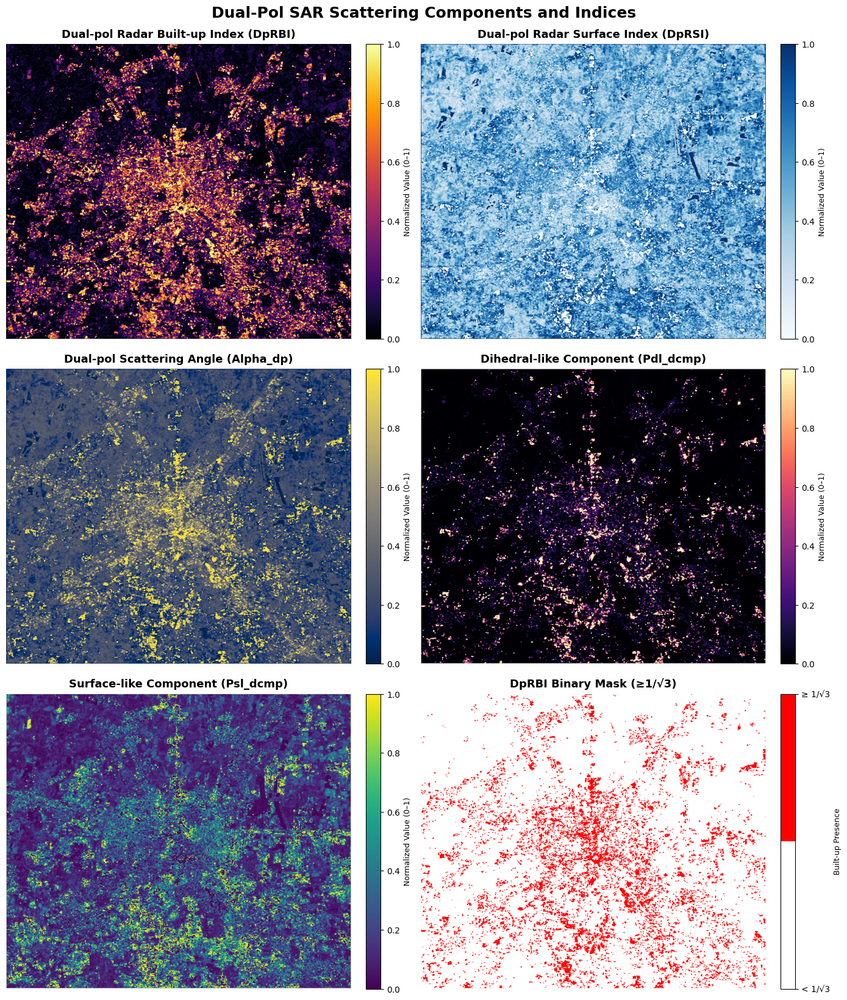

In [9]:
# === Find and order files ===
hdr_files = sorted([f.name for f in POLSAR_RESULTS_IMAGES_FOLDER.glob("*.hdr")])
ordered_hdrs = [hdr for key in DISPLAY_CONFIG for hdr in hdr_files if key in hdr]

polsar_images, titles, cmaps, save_names = [], [], [], []

# === Read images ===
for hdr in ordered_hdrs:
    hdr_path = POLSAR_RESULTS_IMAGES_FOLDER / hdr
    base = hdr_path.with_suffix("")
    img_data = next((str(base) + ext for ext in (".bin", ".img", ".dat") if (Path(str(base) + ext)).exists()), None)
    if img_data is None:
        print(f"⚠️ No data file for {hdr}")
        continue

    img = spectral.envi.open(str(hdr_path), img_data).load().astype(float)
    print(f"Loaded {hdr} with shape {img.shape} and dtype {img.dtype}")

    # Normalize except for binary mask
    if "binary" in hdr.lower():
        img = np.where(img >= 0.5, 1, 0)
    else:
        p2, p98 = np.percentile(img[np.isfinite(img)], (2, 98))
        img = np.clip(img, p2, p98)
        img = (img - p2) / (p98 - p2)

    key = next((k for k in DISPLAY_CONFIG if k in hdr), hdr)
    polsar_images.append(img)
    titles.append(DISPLAY_CONFIG[key]["title"])
    cmaps.append(DISPLAY_CONFIG[key]["cmap"])

# === Plot ===
n = len(polsar_images)
cols = 2
rows = math.ceil(n / cols)
fig, axes = plt.subplots(rows, cols, figsize=(7 * cols, 5.5 * rows))
axes = np.array(axes).reshape(-1)

for i, (img, title, cmap) in enumerate(zip(polsar_images, titles, cmaps)):
    ax = axes[i]
    im = ax.imshow(img, cmap=cmap, aspect="auto")
    ax.set_title(title, fontsize=13, fontweight="bold", pad=8)
    ax.axis("off")

    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    if "binary" in title.lower():
        cbar.set_ticks([0, 1])
        cbar.set_ticklabels(["< 1/√3", "≥ 1/√3"])
        cbar.set_label("Built-up Presence", fontsize=9)
    else:
        cbar.set_label("Normalized Value (0–1)", fontsize=9)

# Hide empty plots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

# === Global figure title ===
plt.suptitle("Dual-Pol SAR Scattering Components and Indices", fontsize=18, fontweight="bold", x=0.5, y=0.99)
plt.tight_layout()

plt.savefig(POLSAR_RESULTS_FIGURES_FOLDER / "mosaic_dual_pol_sar_scattering_components_and_indices.png", dpi=300)
plt.show()

#### 1.4. Visualización RGB de componentes de dispersión

- Funciones auxiliares:

In [10]:
def RGB_func(Pd1, Pu1, Ps1, method_p, p_type1, save_dir):
    """
    Generate and save RGB composite of dual-pol scattering power components.
    R = Pd (dihedral-like)
    G = Pu (unpolarized)
    B = Ps (surface-like)
    """

    # Replace NaNs with 0 to avoid issues in visualization
    Pd1 = np.nan_to_num(Pd1, nan=0)
    Pu1 = np.nan_to_num(Pu1, nan=0)
    Ps1 = np.nan_to_num(Ps1, nan=0)

    # Define scaling ranges depending on the method
    if method_p == "dcmp":
        r_min, r_max = 0, 0.25
        g_min, g_max = 0, 0.15
        b_min, b_max = 0, 0.10
    else:
        r_min, r_max = 0, 0.15
        g_min, g_max = 0, 0.10
        b_min, b_max = 0, 0.06

    # --- Normalization helper function ---
    def normalize_to_1(arr, min_val, max_val):
        return np.clip((arr - min_val) / (max_val - min_val), 0, 1)

    # --- Normalize each channel ---
    R_normalized = normalize_to_1(Pd1, r_min, r_max)
    G_normalized = normalize_to_1(Pu1, g_min, g_max)
    B_normalized = normalize_to_1(Ps1, b_min, b_max)

    # --- Stack RGB channels ---
    rgb_image = np.stack((R_normalized, G_normalized, B_normalized), axis=-1)

    # --- Plot with larger figure size ---
    plt.figure(figsize=(10, 10))
    plt.imshow(rgb_image)
    plt.title("Dual-pol Scattering Power RGB Composite", fontsize=14, fontweight="bold")
    plt.axis("off")
    plt.show()

    # --- Save high-resolution figure ---
    save_dir.mkdir(parents=True, exist_ok=True)
    output_path = save_dir / f"plot_DP_Powers_Dcmp_RGB_{p_type1}.png"
    plt.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.close()

    print(f'Dual-pol Scattering Power "RGB" Composite composite saved as: {output_path}')

- Código principal:

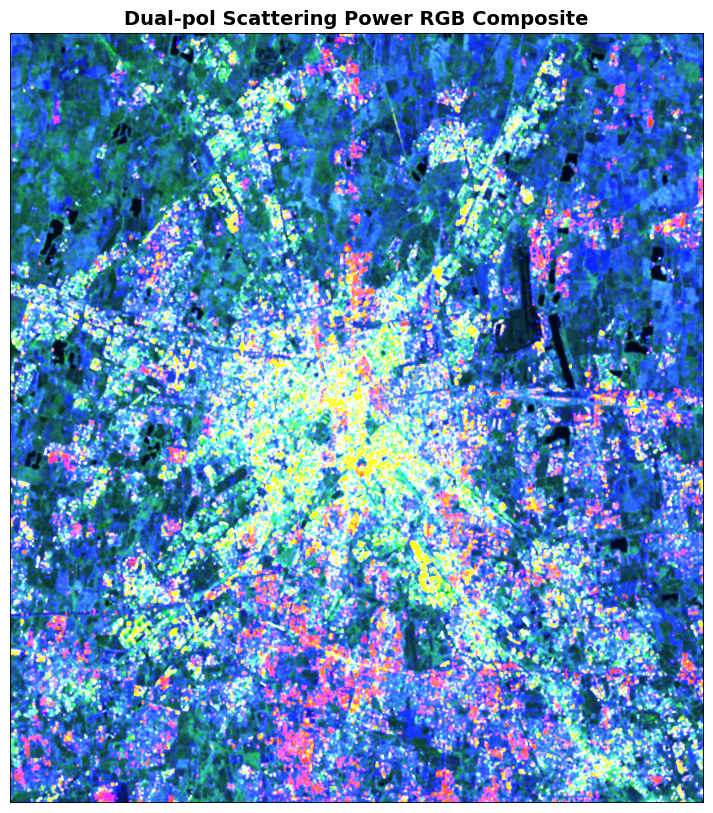

Dual-pol Scattering Power "RGB" Composite composite saved as: resources\results\pol_sar\figures\plot_DP_Powers_Dcmp_RGB_SLC.png


In [11]:
RGB_func(Pd, Pu, Ps, METHOD, P_TYPE, POLSAR_RESULTS_FIGURES_FOLDER)

### 2. Extract **spectral indicators** and **fractional information** describing the distribution of urban and natural surface materials.

#### 2.1. Preprocesamiento de PRISMA HSI

##### 2.1.1. Dataset

PRISMA (Hyperspectral Precursor of the Application Mission), mission fully funded by Italian Space Agency (ASI), is an Earth Observation system with innovative, electro-optical instrumentation that combine a hyperspectral sensor with a medium-resolution panchromatic camera.

The advantages of this combination are that in addition to the usual capability of observation based on recognising the geometric characteristics of the scene there are hyperspectral sensors which determine the chemical-physical composition of the objects present on the scene.

More information about PRISMA mission can be found [here](http://www.prisma-i.it/index.php/en/).

##### 2.1.2. Unmixing

Unmixing is a technique used in hyperspectral image analysis to decompose the spectral signature of each pixel into a collection of constituent spectra, known as endmembers, and their corresponding proportions, referred to as abundances. This process is essential for understanding the composition of mixed pixels, which often occur in remote sensing data due to the limited spatial resolution of sensors.

🔹 One can assume 4 main types of mixing types:

1. **Linear Mixing (Macroscopic)** – Materials are spatially separated within the pixel.  
   The reflected light from each material reaches the sensor independently and adds linearly.  
   ➤ Example: vegetation and soil side by side.

2. **Multi-Layer Mixing** – Materials are arranged in layers (e.g., leaves over soil).  
   Light passes through or reflects between layers, producing a **nonlinear** mixture.  
   ➤ Example: snow over vegetation, canopy over soil.

3. **Intimate Mixing (Microscopic)** – Materials are mixed at microscopic scales (smaller than the wavelength).  
   Light scatters multiple times within the mixture, leading to **strong nonlinear behavior**.  
   ➤ Example: mineral powders, moist soil, or sand mixtures.

4. **Spectral Variability** – The same material shows spectral changes due to illumination, moisture, or geometry.  
   It is not a mixing process but a **source of uncertainty** that affects endmember definition.  
   ➤ Example: vegetation with different water content.

The best suited unmixing model for this task is the **Linear Mixing Model (LMM)**, which assumes that the observed spectrum of a pixel is a linear combination of the spectra of the endmembers present in that pixel, weighted by their respective abundances.

🔹 The linear spectral unmixing model can be expressed as:

$
\mathbf{X} \approx \mathbf{E}\mathbf{A},
$

where:  
- $ \mathbf{X} \in \mathbb{R}^{L \times N} $: observed spectra (L = number of spectral bands, N = number of pixels),  
- $ \mathbf{E} \in \mathbb{R}^{L \times p} $: **endmember matrix**, containing the spectral signatures of pure materials,  
- $ \mathbf{A} \in \mathbb{R}^{p \times N} $: **abundance matrix**, containing the fractional contributions of each endmember to each pixel,  
- $ p $: **number of endmembers**, i.e., the number of spectrally distinct materials or sources in the scene.

Because many different pairs $(\mathbf{E}, \mathbf{A})$ can reproduce the same $\mathbf{X}$, the factorization is **non-unique** and **ill-posed**.  
To regularize the problem and make it physically interpretable, we impose the following constraints:

$
\mathbf{A} \ge 0, \quad \sum_i a_i = 1,
$

which enforce:
- **non-negativity** → reflectances and abundances cannot be negative,  
- **sum-to-one** → abundances represent proportions that add up to one per pixel.

These constraints make the unmixing problem more **well-posed** and physically meaningful.

The objective is to estimate both the endmember matrix $\mathbf{E}$ and the abundance matrix $\mathbf{A}$ from the observed spectra $\mathbf{X}$, given the constraints above.

##### 2.1.3. Data exploration

Al chequear la información de PRISMA se indica que la resolución espacial es de 30 metros y hay varios tipos de bandas. Según https://www.eoportal.org/satellite-missions/prisma-hyperspectral#prisma, hay dos tipos de canales (VNIR y SWIR):
- VNIR (Visible and Near Infrared): 400 nm to 1010 nm (bands 1 to 66) -> 66 bands.
- SWIR (Short Wave Infrared): 920 nm to 2505 nm (bands 67 to 243) -> 173 bands.

O sea, en total son 239 bandas.

También el formato depende del tipo de imagen. En este caso, se tiene una imagen del tipo "L2D_STD", que según la documentación es un producto de nivel 2D estándar, que incluye correcciones radiométricas y geométricas.

PRISMA contiene más resolución espectral que Sentinel-2. Específicamente en la siguiente imagen (obtenida de ) se pueden observar una comparativa entre las bandas:

<div align="center"><img src="resources/images/prisma-vs-sentinel2-bands.png" width="600" alt="Figure 3. Comparison of spectral bands between PRISMA and Sentinel-2"></div>

También se puede observar en la siguiente tabla (obtenida de https://www.researchgate.net/publication/372304317_Band-Optimized_Bidirectional_LSTM_Deep_Learning_Model_for_Bathymetry_Inversion/figures?lo=1):

<div align="center"><img src="resources/images/prisma-vs-sentienl2-bands-table.jpg" width="600" alt="Figure 3. Comparison of spectral bands between PRISMA and Sentinel-2"></div>

El espectro visible del ojo humano va desde aproximadamente 400 nm (violeta) hasta 800 nm (rojo). En donde:
- Rojo: 600-700 nm.
- Verde: 500-600 nm.
- Azul: 400-450 nm.

Por lo tanto, las bandas de PRISMA que corresponden al espectro visible son aquellas que cubren este rango de longitudes de onda. En la siguiente tabla se muestran las bandas de PRISMA que corresponden al espectro visible:

| Banda PRISMA | Sentinel 2 | Color aproximado |
|-------|-----------------------|------------------|
| 35     |          4          | Rojo          |
| 47     |         3           | Verde             |
| 59     |          2          | Azul             |

Estableciendo estas bandas en QGis, se obtiene la siguiente imagen RGB:

<div align="center"><img src="resources/images/qgis-screenshot.png" width="600" alt="Figure 4. PRISMA RGB image of Milan city"></div>

- Funciones auxiliares:

In [12]:
PRISMA_R_BAND = 34
PRISMA_G_BAND = 46
PRISMA_B_BAND = 58

def get_rgb(img):
    r = img[..., PRISMA_R_BAND]
    g = img[..., PRISMA_G_BAND]
    b = img[..., PRISMA_B_BAND]
    rgb = np.zeros((img.shape[0], img.shape[1], 3))
    rgb[..., 0] = r
    rgb[..., 1] = g
    rgb[..., 2] = b

    return rgb


def composite(s1):
    """
    [1] https://gis.stackexchange.com/questions/400726/creating-composite-rgb-images-from-sentinel-1-channels
    """

    vv_band = s1[:, :, 0]
    vh_band = s1[:, :, 1]
    # Clip values derived from [1]
    vv_band = np.clip(vv_band, 0.0, 0.3)
    vh_band = np.clip(vh_band, 0.0, 0.05)

    vv_band_norm = (vv_band - vv_band.min()) / (vv_band.max() - vv_band.min())
    vh_band_norm = (vh_band - vh_band.min()) / (vh_band.max() - vh_band.min())

    # Calculate ratio of VV/VH
    ratio_band = np.divide(vv_band_norm, vh_band_norm, where=vh_band_norm != 0)

    # Clip values derived from [1]
    ratio_band = np.clip(ratio_band, 0, 25)

    # Create RGB composite
    rgb = np.dstack((vv_band_norm, vh_band_norm, ratio_band))

    return rgb


def reject_outliers(img, perc=98):
    """
    Function used to remove outliers from the image data by clipping values above a certain percentile.
    Clips all values in s1_2 to be within the range [0, p], where p is the percentile value (which is a
    measure that indicates the value below which a given percentage of observations).
    fall."""
    p = np.percentile(img, perc)
    img = np.clip(img, 0.0, p)

    return img


def read_data(path, normalize=False, norm_band=False, select_bands=True):
    """
    Read and preprocess remote sensing data from a raster file.

    This function loads a raster image using rasterio, with options for band selection,
    normalization, and outlier rejection. It's designed to work with multispectral data
    like Sentinel or PRISMA imagery.

    Parameters
    ----------
    path : str or Path
        Path to the raster file to be read (e.g., GeoTIFF, ENVI format).
    normalize : bool, optional
        If True, applies outlier rejection and normalization to the data (default: False).
    norm_band : bool, optional
        If True and normalize=True, normalizes each band independently.
        If False, normalizes the entire image globally (default: False).
    select_bands : bool, optional
        If True, selects specific bands (R, G, B, NIR at indices 3, 2, 1, 7).
        If False, loads all bands (default: True).

    Returns
    -------
    img : numpy.ndarray
        Processed image array with shape (height, width, bands).
        - If select_bands=True: returns 4 bands (R, G, B, NIR)
        - If select_bands=False: returns all available bands
        - NaN values are replaced with the mean of the image
        - Values are normalized to [0, 1] range if normalize=True

    Notes
    -----
    - The function assumes a specific band ordering for RGB extraction (bands 1, 2, 3)
      and NIR at band 7, typical of multispectral sensors.
    - Outlier rejection clips values above the 98th percentile by default.
    - The image is transposed from (bands, height, width) to (height, width, bands)
      for easier manipulation with matplotlib and other libraries.

    Examples
    --------
    >>> # Read and normalize PRISMA hyperspectral data with band selection
    >>> img = read_data('path/to/prisma.tif', normalize=True, norm_band=True)
    >>> print(img.shape)  # (height, width, 4)

    >>> # Read all bands without normalization
    >>> img_full = read_data('path/to/image.tif', select_bands=False)
    """
    with rasterio.open(path) as src:
        raster_img = src.read()  # Load bands into memory (bands, height, width)
        img = np.moveaxis(raster_img, 0, -1)  # (bands, height, width) -> (height, width, bands)

        if select_bands:
            height, width, _ = img.shape
            img_selected_bands = np.zeros((height, width, 4))
            nir = np.expand_dims(img[..., 7], axis=-1)  # NIR band
            img_selected_bands = np.concatenate((get_rgb(img), nir), axis=-1)  # R, G, B, NIR
            img = img_selected_bands

        if normalize:
            img = reject_outliers(img)
            if norm_band:  # Normalize each band independently using it's own min/max
                for x in range(img.shape[-1]):
                    img[:, :, x] = (img[:, :, x] - np.nanmin(img[:, :, x])) / (
                        (np.nanmax(img[:, :, x]) - np.nanmin(img[:, :, x])) + 0.0001
                    )
            else:  # Normalize the entire image globally
                img = (img - np.nanmin(img)) / (np.nanmax(img) - np.nanmin(img))  # Min-Max normalization
    img[np.isnan(img)] = np.nanmean(img)  # Replace NaNs with mean of the image (corrupted pixels)

    return img

- Código principal:

In [13]:
PRISMA_IMAGE_NAME = "PRS_L2D_STD_20200111102713_20200111102717_0001_clip.tif"
PRISMA_IMAGE_PATH = PRODUCTS_FOLDER / PRISMA_IMAGE_NAME
img = read_data(path=PRISMA_IMAGE_PATH, normalize=True, norm_band=True, select_bands=False)

print(f"Image shape: {img.shape}")

Image shape: (714, 712, 239)


Mostramos la imagen en RGB:

(np.float64(-0.5), np.float64(711.5), np.float64(713.5), np.float64(-0.5))

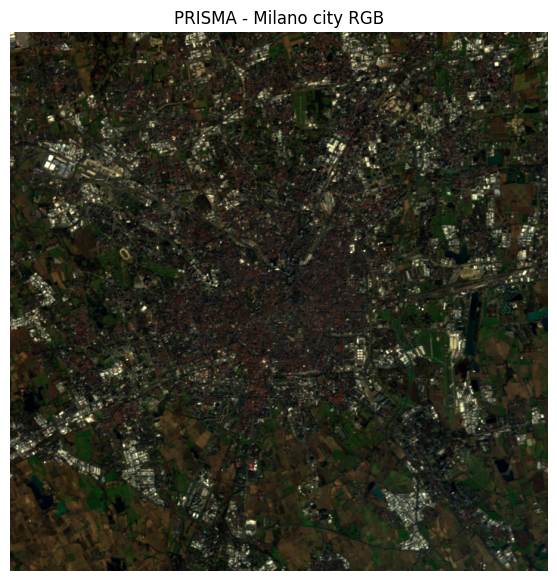

In [14]:
img_rgb = get_rgb(img)

# Save RGB raw image
plt.imsave(PRISMA_MILANO_RGB_PATH, img_rgb)

plt.figure(figsize=(12, 7))
plt.imshow(img_rgb)
plt.title("PRISMA - Milano city RGB")
plt.savefig(HYPERSPECTRAL_RESULTS_FIGURES_FOLDER / "PRISMA_Milano_city_RGB_figure.png", dpi=300, bbox_inches="tight")
plt.axis("off")

##### 2.1.4. Endmember extraction

En base a la imagen, se puede estimar 4 endmembers (píxeles puros) principales que representan los materiales dominantes en la escena:
- Heavy dense urban surfaces (construcciones densas)
- Vegetation (áreas verdes)
- Land/Soil (áreas de tierra)
- Roofing materials (materiales de techos)

In [15]:
print("- Img original shape:", img.shape)
n_r, n_c, n_b = img.shape

# Spectral unmixing algorithms work with the Linear Mixing Model: 
# X≈EA, where:
# - X is the observed spectra matrix (pixels × bands)
# - E is the endmember matrix (bands × endmembers) containing pure material signatures
# - A is the abundance matrix (endmembers × pixels) with fractional contributions

# Hacer reshape a 2D array de pixeles y bandas
X = img.reshape(-1, img.shape[-1]) # (height, width, bands) -> (height*width, bands)
print("- X shape:", X.shape)

- Img original shape: (714, 712, 239)
- X shape: (508368, 239)


###### 2.1.4.1. Automatic endmember extraction using SPICE algorithm

In [16]:
if TRAIN:
    # Create a SPICE parameter object (to configure algorithm hyperparameters)
    params = SPICEParameters(M=10, iterationCap=100)

    # Prepare the hyperspectral input data (transpose so each column = pixel spectrum)
    inputData = X.T.astype(float)

    [eM, dsP] = SPICE(inputData, params)

###### 2.1.4.2. Manual endmember selection

Para extraer los endmembers manualmente, utilizamos Pixel Purity Index (PPI) en donde asumimos que existe un pixel puro, que contiene la máxima pureza espectral, o sea, un único material y visualizamos los espectros de los píxeles más puros para seleccionar manualmente los endmembers representativos de cada clase.

In [17]:
from pysptools.eea.eea import PPI

print("- Img original shape:", img.shape)
print("- X shape:", X.shape)

numSkewers = 1000

# Run the Pixel Purity Index algorithm to extract endmembers and their pixel indices
E, inds = PPI(X, ENDMEMBERS_Q, numSkewers)
print(f"- E shape: {E.shape} → Extracted endmember matrix (endmembers × bands)")
print(f"- Inds shape: {len(inds)} → Indices of endmember pixels in X")

- Img original shape: (714, 712, 239)
- X shape: (508368, 239)
- E shape: (4, 239) → Extracted endmember matrix (endmembers × bands)
- Inds shape: 4 → Indices of endmember pixels in X


Text(0.5, 1.0, 'PPI Endmembers')

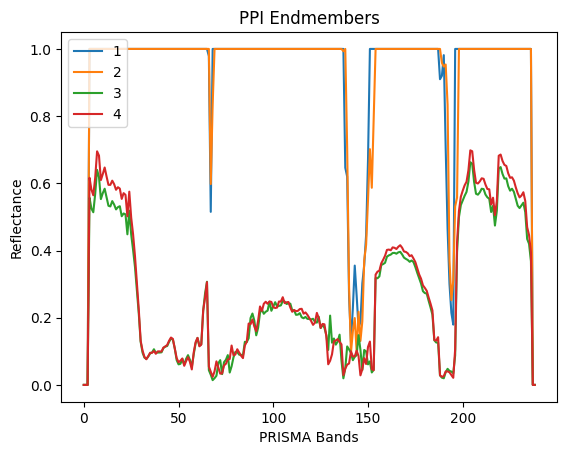

In [18]:
plt.plot(E.T)
plt.xlabel("PRISMA Bands")
plt.ylabel("Reflectance")
plt.legend([str(i + 1) for i in range(ENDMEMBERS_Q)], loc="upper left")
ymin, ymax = np.min(E), np.max(E)
plt.ylim(ymin - 0.05 * (ymax - ymin), ymax + 0.05 * (ymax - ymin))
plt.title("PPI Endmembers")

#### 2.2.1. Abundance estimation using Fully Constrained Least Squares (FCLS)

Una vez estimados los endmembers, se puede obtener resolver la matriz de abundancias $\mathbf{A}$ utilizando el método de Fully Constrained Least Squares (FCLS), que minimiza la diferencia entre las observaciones y la reconstrucción lineal bajo las restricciones de no negatividad y suma a uno. Es realizar mínimos cuadrados con restricciones (Lagrange multipliers o métodos de optimización convexa).

In [19]:
from pysptools.abundance_maps.amaps import FCLS

maps = FCLS(X, E)  # Abundance maps for each endmember
print(f"- X shape: {X.shape} → Valid pixels matrix (num_pixels × num_bands)")
print(f"- E shape: {E.shape} → Endmember matrix (num_endmembers x num_bands)")
print(f"- Maps shape: {maps.shape} → Estimated abundance matrix (num_pixels × num_endmembers)")

- X shape: (508368, 239) → Valid pixels matrix (num_pixels × num_bands)
- E shape: (4, 239) → Endmember matrix (num_endmembers x num_bands)
- Maps shape: (508368, 4) → Estimated abundance matrix (num_pixels × num_endmembers)


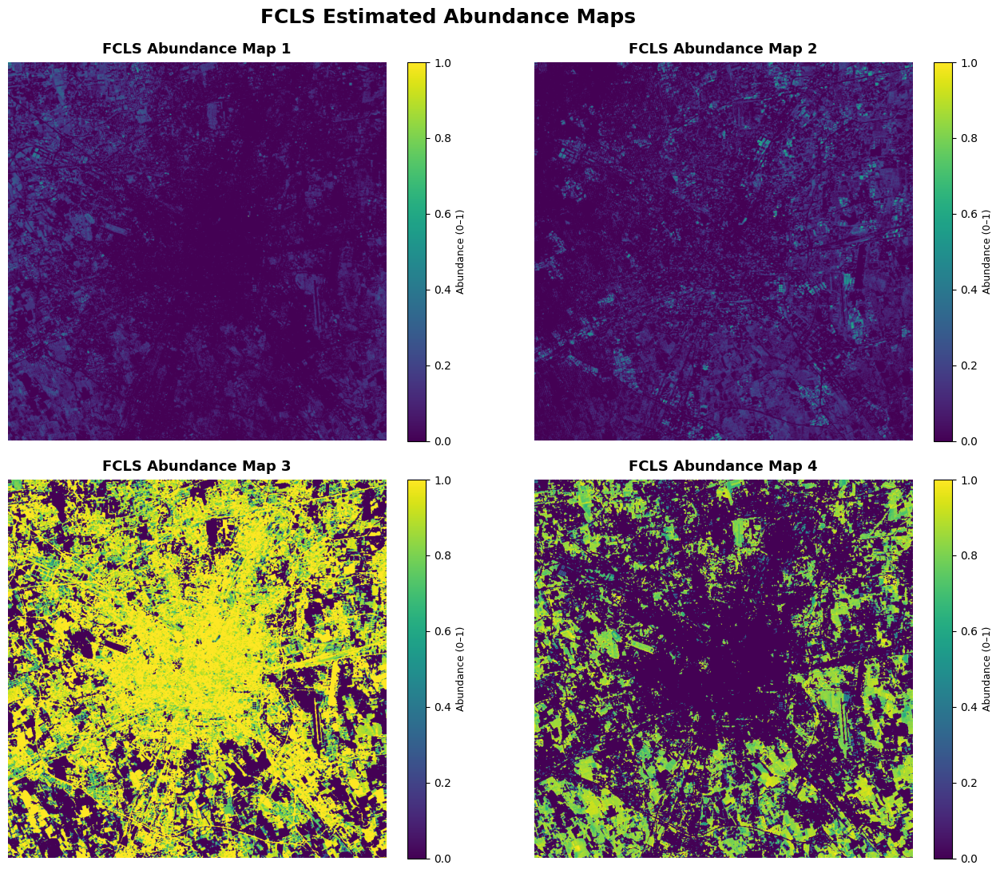

In [20]:
# Reconstruct (re-ravel) the abundance maps into 2D images for each endmember
abundance_maps = []

# Loop over each estimated endmember (q = number of materials)
for i in range(ENDMEMBERS_Q):
    # Initialize an empty 1D array for the full image (flattened)
    map_lin = np.zeros(n_r * n_c)

    # Fill valid pixel positions with the estimated abundances for endmember i
    map_lin = maps[:, i]

    # Reshape the 1D abundance vector back into a 2D image (rows × columns)
    img = map_lin.reshape(n_r, n_c)
    # Save the abundance map image
    output_path = HYPERSPECTRAL_RESULTS_IMAGES_FOLDER / f"FCLS_Abundance_Map_{i + 1}.png"
    plt.imsave(output_path, img)

    abundance_maps.append(img)

n = len(abundance_maps)
cols = 2
rows = math.ceil(n / cols)
fig, axes = plt.subplots(rows, cols, figsize=(7 * cols, 5.5 * rows))
axes = np.array(axes).reshape(-1)

for i in range(ENDMEMBERS_Q):
    ax = axes[i]
    im = ax.imshow(abundance_maps[i], vmin=0, vmax=1)
    ax.set_title(f"FCLS Abundance Map {i + 1}", fontsize=13, fontweight="bold", pad=8)
    ax.axis("off")

    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("Abundance (0–1)", fontsize=9)

# Hide empty plots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.suptitle("FCLS Estimated Abundance Maps", fontsize=18, fontweight="bold", x=0.5, y=0.99)
plt.tight_layout()

plt.savefig(HYPERSPECTRAL_RESULTS_FIGURES_FOLDER / "Mosaic_FCLS_Estimated_Abundance_Maps.png", dpi=300)
plt.show()

#### 2.3.1. Conclusions

Conclusiones de la imagen.

### 3. Harmonize SAR- and HSI-derived products to a common spatial grid and compare them against the different LULC classes.

#### 3.1. Harmonization of SAR- and HSI-derived products

In [39]:
def resize_like(master, slave):
    """Resize slave to master's H×W with automatic interpolation."""
    target_h, target_w = master.shape[:2]

    # Guard against NaNs
    img = np.nan_to_num(slave)

    # Choose interpolation automatically
    if img.dtype == np.bool_ or np.issubdtype(img.dtype, np.integer):
        inter = cv2.INTER_NEAREST  # preserve discrete labels
        if img.dtype == np.bool_:
            img = img.astype(np.uint8)
    else:
        # Use a CV-friendly float dtype
        if img.dtype not in (np.float32, np.uint8, np.uint16, np.int16):
            img = img.astype(np.float32)
        inter = cv2.INTER_LINEAR

    resized = cv2.resize(img, (target_w, target_h), interpolation=inter)

    # If original had a trailing singleton channel, preserve it
    if resized.ndim == 2 and slave.ndim == 3 and slave.shape[-1] == 1:
        resized = resized[..., None]

    return resized

In [22]:
assert len(polsar_images) > 0, "No POLSAR images loaded for fusion."
assert len(abundance_maps) > 0, "No hyperspectral abundance maps loaded for fusion."

In [40]:
img_rgb_master = cv2.imread(str(PRISMA_MILANO_RGB_PATH), cv2.IMREAD_COLOR)

print(f"Image shape: {img_rgb_master.shape}")

Image shape: (714, 712, 3)


In [42]:
# Resize polsar images to match PRISMA RGB dimensions
resized_polsar_images = [resize_like(img_rgb_master, img) for img in polsar_images]

# Resize abundance maps to match PRISMA RGB dimensions
resized_abundance_maps = [resize_like(img_rgb_master, img) for img in abundance_maps]

Show images: